In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

symbols = ['IVV','IDU','IYC','IYE','IYF','IYH','IYJ','IYK','IYM','IYR','IYW','IYZ']

years = np.arange(2007,2017)
# IVV - S&P 500
# IDU - Utilities
# IYC - Consumer Services
# IYE - Energy
# IYF - Financials
# IYH - Health Care
# IYJ - Industrials
# IYK - Consumer Goods
# IYM - Materials
# IYR - Real Estate
# IYW - Technology
# IYZ - Communication

In [3]:
df_etf_data = pd.read_csv('df_etf_price_data.csv')
df_etf_data.dateYYMD = df_etf_data.dateYYMD.astype('datetime64')
df_etf_data['year'] = df_etf_data['dateYYMD'].dt.year

In [54]:
#split price data by symbol and year, then by year
groups = df_etf_data.groupby(['symbol',pd.TimeGrouper('A',key='dateYYMD')])
#groups_year = df_etf_data.groupby(pd.TimeGrouper('A',key='dateYYMD'))
groups_year = df_etf_data.groupby('year')
groups_symbol = df_etf_data.groupby('symbol')

<h1>Statistics by ETF</h1>

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


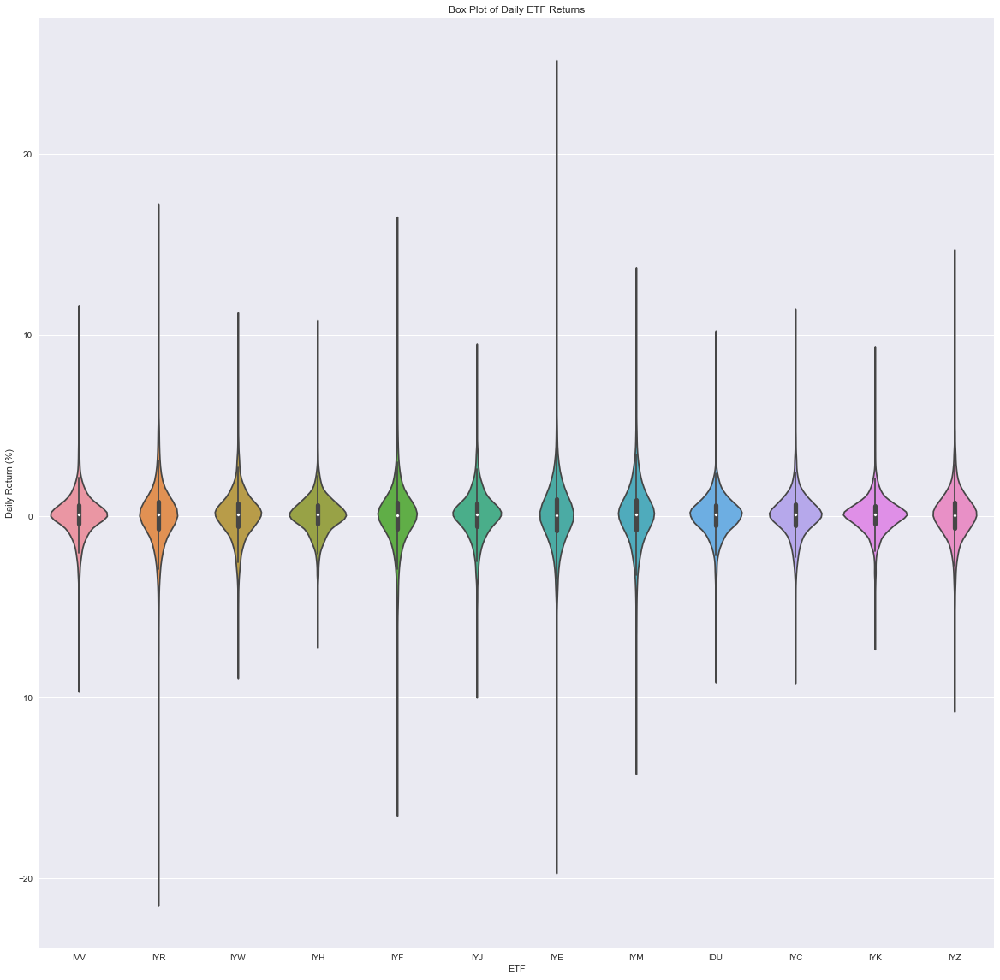

In [5]:
plt.figure(figsize=(20,20))
df_boxplot_data = df_etf_data[['symbol','PctChg']]
df_boxplot_data['PctChgPlot'] = df_boxplot_data['PctChg']*100
#df_boxplot_data.boxplot(column='PctChgPlot',by='symbol',figsize=(20,10),whis=(1,99),showfliers=True)
#ax = sns.boxplot(x=df_boxplot_data['symbol'],y=df_boxplot_data['PctChgPlot'],whis=(1,99))
ax = sns.violinplot(data=df_boxplot_data,x='symbol',y='PctChgPlot')
#ax = sns.swarmplot(x=df_boxplot_data['symbol'],y=df_boxplot_data['PctChgPlot'])
plt.title('Box Plot of Daily ETF Returns')
plt.xlabel('ETF')
plt.ylabel('Daily Return (%)')
#plt.ylim(-10,10)
plt.show()

In the above box plot, the whiskers are set at the 1st and 99th percentiles.

From the above chart, we can see that IYE (Energy), IYF (Financials), IYM (Materials) and IYR (Real Estate) are the riskier ETF's in relation to all ETF's. In particular, the Energy ETF has shown the some of largest daily gains and loses. We will be looking at the timing of some of the largest daily gains and losses below.

In [6]:
pd.set_option('display.max_rows', 100)
df_etf_data.groupby('symbol').agg(['mean','std'])['PctChg']

,mean,std
symbol,,
IDU,0.000153,0.011784
IVV,0.000283,0.012971
IYC,0.000391,0.012629
IYE,0.000237,0.019108
IYF,0.000139,0.020456
IYH,0.000360,0.011052
IYJ,0.000326,0.014260
IYK,0.000284,0.010318
IYM,0.000278,0.018631


The standard deviation above confirms the findings from the box plot. Note that a higher standard deviation does not necesarily indicate higher average return. We will dig a little bit deeper to see how these ETF's have fared over the years.

<h1>Statistics by Year</h1>

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


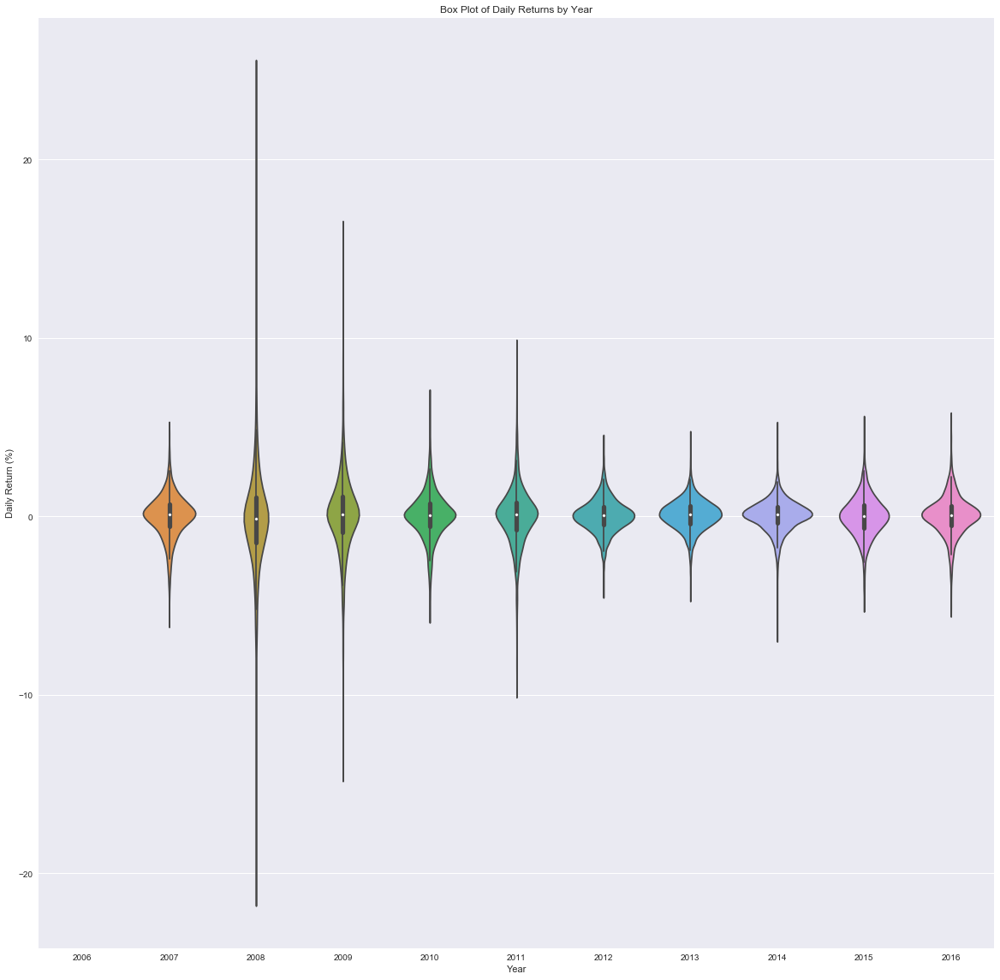

In [7]:
plt.figure(figsize=(20,20))
df_boxplot_data = df_etf_data[['year','PctChg']]
df_boxplot_data['PctChgPlot'] = df_boxplot_data['PctChg']*100
sns.violinplot(data=df_boxplot_data,x='year',y='PctChgPlot')
#df_boxplot_data.boxplot(column='PctChgPlot',by='year',figsize=(26,25),whis=(0.5,99.5))
plt.title('Box Plot of Daily Returns by Year')
plt.xlabel('Year')
plt.ylabel('Daily Return (%)')
#plt.ylim(-15,15)
plt.show()

In [8]:
df_etf_data.groupby('year').agg(['mean','std'])['PctChg'][1:]

,mean,std
year,,
2007,0.000268,0.011842
2008,-0.001624,0.029992
2009,0.001158,0.022196
2010,0.000525,0.012911
2011,-0.000038,0.016020
2012,0.000470,0.009054
2013,0.000909,0.008383
2014,0.000534,0.008511
2015,0.000037,0.011197


The years with the highest volatility in daily returns were 2008 and 2009, both being part of the 2008-09 crash.

<h1>Statistics by Year and ETF</h1>

We will now look into statistics of daily returns by both the year and ETF.

In [26]:
groups_symbol.get_group('IVV')

,PctChg,adjclose,amount,close,data,date,dateYYMD,denominator,high,low,numerator,open,splitRatio,type,volume,year
0,NaN,113.754021,NaN,142.000000,NaN,1167402600,2006-12-30,NaN,142.830002,141.750000,NaN,142.429993,NaN,NaN,853200.0,2006
1,-0.002676,113.449600,NaN,141.619995,NaN,1167834600,2007-01-04,NaN,143.130005,140.860001,NaN,142.529999,NaN,NaN,2001100.0,2007
2,0.002683,113.754021,NaN,142.000000,NaN,1167921000,2007-01-05,NaN,142.320007,140.949997,NaN,141.679993,NaN,NaN,4038600.0,2007
3,-0.007676,112.880806,NaN,140.910004,NaN,1168007400,2007-01-06,NaN,141.600006,140.660004,NaN,141.600006,NaN,NaN,2028700.0,2007
4,0.004187,113.353439,NaN,141.500000,NaN,1168266600,2007-01-09,NaN,141.660004,140.550003,NaN,141.070007,NaN,NaN,642300.0,2007
5,-0.000848,113.257309,NaN,141.380005,NaN,1168353000,2007-01-10,NaN,141.770004,140.669998,NaN,141.660004,NaN,NaN,989000.0,2007
6,0.002688,113.561714,NaN,141.759995,NaN,1168439400,2007-01-11,NaN,141.809998,140.589996,NaN,140.809998,NaN,NaN,1738800.0,2007
7,0.005220,114.154533,NaN,142.500000,NaN,1168525800,2007-01-12,NaN,142.910004,141.779999,NaN,141.880005,NaN,NaN,693700.0,2007
8,0.007509,115.011726,NaN,143.570007,NaN,1168612200,2007-01-13,NaN,143.570007,142.460007,NaN,142.479996,NaN,NaN,634000.0,2007
9,-0.002020,114.779388,NaN,143.279999,NaN,1168957800,2007-01-17,NaN,143.589996,143.029999,NaN,143.449997,NaN,NaN,813400.0,2007


/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


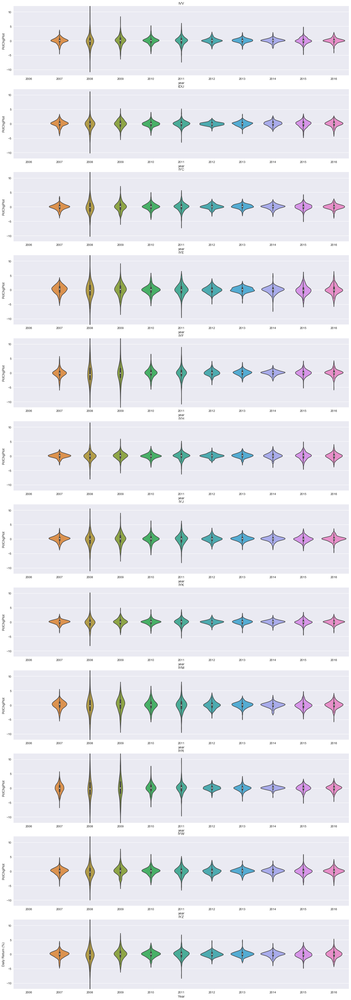

In [48]:
nrows = len(symbols)
fig, axes = plt.subplots(nrows,1,figsize=(20,60),sharey=True)
plt.ylim(-12,12)
for n in range(nrows):  
    symbol = symbols[n]
    group = groups_symbol.get_group(symbols[n])
    group['PctChgPlot'] = group['PctChg']*100
    x = group['year']
    y = group['PctChgPlot']
    sns.violinplot(x,y,ax=axes[n])
    axes[n].set_title(symbol)
    
plt.xlabel('Year')
plt.ylabel('Daily Return (%)')
plt.show()


IDU Descriptive Statistics
   year      mean       std
0  2007  0.000556  0.010795
1  2008 -0.001485  0.022282
2  2009  0.000383  0.013246
3  2010  0.000017  0.009738
4  2011  0.000516  0.010862
5  2012 -0.000118  0.006045
6  2013  0.000464  0.007812
7  2014  0.000943  0.008346
8  2015 -0.000274  0.011021
9  2016  0.000533  0.009840


/Users/Derek/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


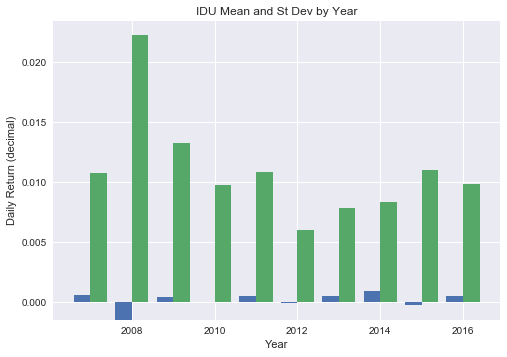


IVV Descriptive Statistics
   year      mean       std
0  2007  0.000172  0.010133
1  2008 -0.001716  0.024851
2  2009  0.001017  0.016903
3  2010  0.000594  0.011318
4  2011  0.000076  0.014642
5  2012  0.000503  0.008047
6  2013  0.001074  0.007090
7  2014  0.000589  0.007028
8  2015  0.000173  0.009850
9  2016  0.000361  0.008337


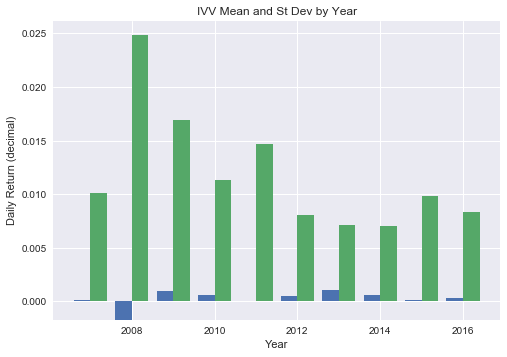


IYC Descriptive Statistics
   year      mean       std
0  2007 -0.000301  0.009683
1  2008 -0.001231  0.023656
2  2009  0.001157  0.016087
3  2010  0.000732  0.011423
4  2011  0.000167  0.014022
5  2012  0.000777  0.007908
6  2013  0.001409  0.007511
7  2014  0.000618  0.007975
8  2015  0.000412  0.009835
9  2016  0.000179  0.008595


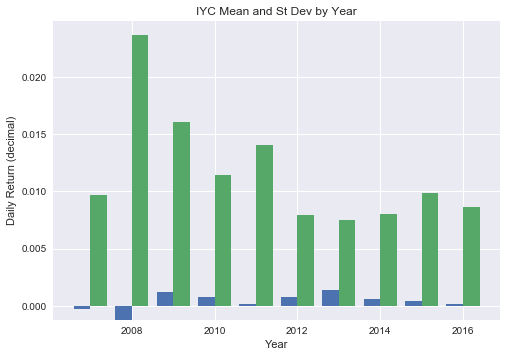


IYE Descriptive Statistics
   year      mean       std
0  2007  0.001292  0.014602
1  2008 -0.001444  0.039114
2  2009  0.000907  0.021417
3  2010  0.000599  0.014469
4  2011  0.000089  0.019462
5  2012  0.000149  0.011376
6  2013  0.000877  0.009043
7  2014 -0.000293  0.012213
8  2015 -0.000776  0.015899
9  2016  0.000977  0.015842


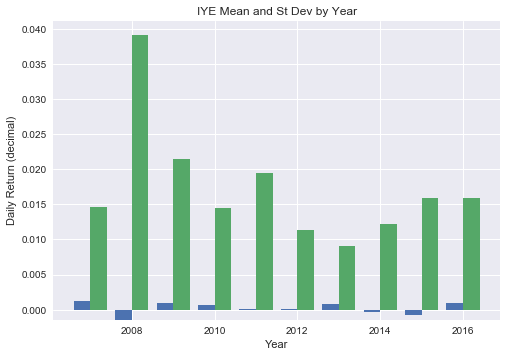


IYF Descriptive Statistics
   year      mean       std
0  2007 -0.000764  0.014362
1  2008 -0.002090  0.039782
2  2009  0.001235  0.036075
3  2010  0.000345  0.015179
4  2011 -0.000641  0.019843
5  2012  0.000888  0.010106
6  2013  0.001069  0.008811
7  2014  0.000661  0.007658
8  2015  0.000100  0.010494
9  2016  0.000595  0.010881


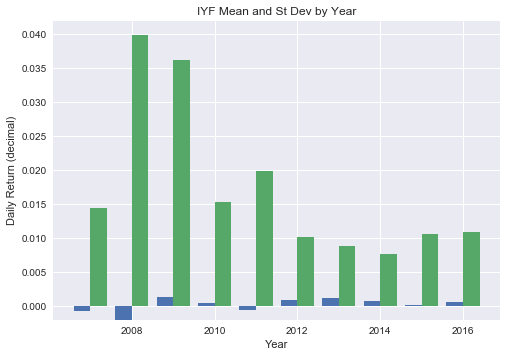


IYH Descriptive Statistics
   year      mean       std
0  2007  0.000311  0.007568
1  2008 -0.000991  0.018411
2  2009  0.000742  0.012404
3  2010  0.000054  0.009398
4  2011  0.000332  0.012516
5  2012  0.000629  0.007049
6  2013  0.001385  0.007771
7  2014  0.000928  0.009092
8  2015  0.000419  0.011484
9  2016 -0.000193  0.009994


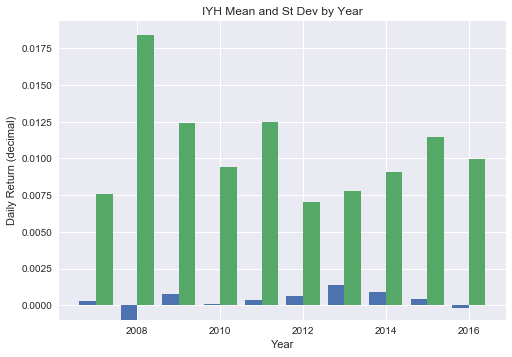


IYJ Descriptive Statistics
   year      mean       std
0  2007  0.000527  0.010059
1  2008 -0.001825  0.024885
2  2009  0.000923  0.019992
3  2010  0.000752  0.013684
4  2011 -0.000113  0.017375
5  2012  0.000628  0.009573
6  2013  0.001329  0.008255
7  2014  0.000387  0.008527
8  2015  0.000022  0.010029
9  2016  0.000643  0.009352


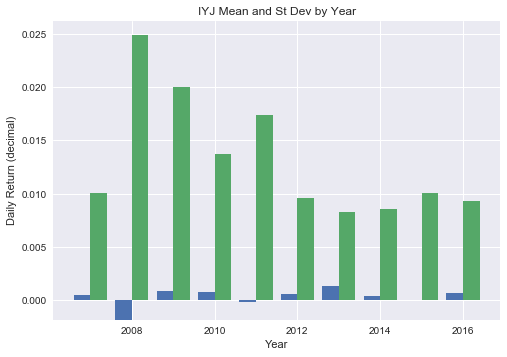


IYK Descriptive Statistics
   year      mean       std
0  2007  0.000327  0.007776
1  2008 -0.001163  0.019260
2  2009  0.000732  0.011638
3  2010  0.000572  0.009018
4  2011  0.000176  0.011447
5  2012  0.000364  0.006729
6  2013  0.000996  0.007355
7  2014  0.000467  0.006387
8  2015  0.000286  0.009037
9  2016  0.000089  0.007900


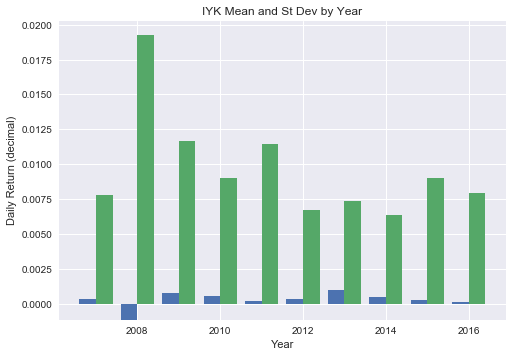


IYM Descriptive Statistics
   year      mean       std
0  2007  0.001107  0.014202
1  2008 -0.002301  0.035474
2  2009  0.002175  0.025034
3  2010  0.000935  0.017361
4  2011 -0.000664  0.021112
5  2012  0.000298  0.012456
6  2013  0.000710  0.009794
7  2014  0.000225  0.009227
8  2015 -0.000392  0.012212
9  2016  0.000703  0.012028


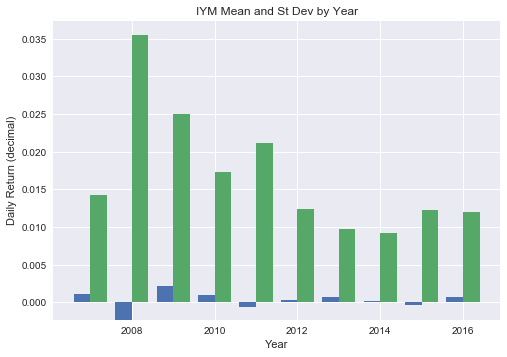


IYR Descriptive Statistics
   year      mean       std
0  2007 -0.000742  0.016222
1  2008 -0.001293  0.044814
2  2009  0.001793  0.039120
3  2010  0.000674  0.016414
4  2011  0.000121  0.017752
5  2012  0.000489  0.008034
6  2013 -0.000126  0.009649
7  2014  0.000915  0.006326
8  2015  0.000048  0.010283
9  2016  0.000160  0.010413


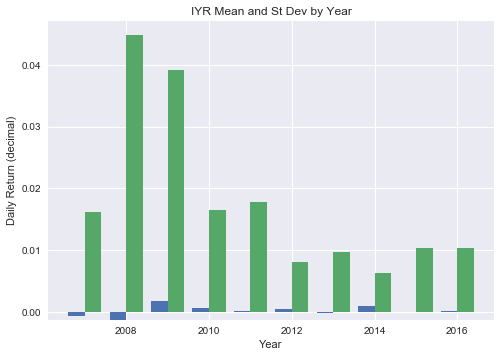


IYW Descriptive Statistics
   year      mean       std
0  2007  0.000648  0.011445
1  2008 -0.001957  0.024680
2  2009  0.001944  0.016758
3  2010  0.000438  0.012661
4  2011 -0.000054  0.015234
5  2012  0.000410  0.010469
6  2013  0.000943  0.008298
7  2014  0.000895  0.008700
8  2015  0.000281  0.011715
9  2016  0.000455  0.010754


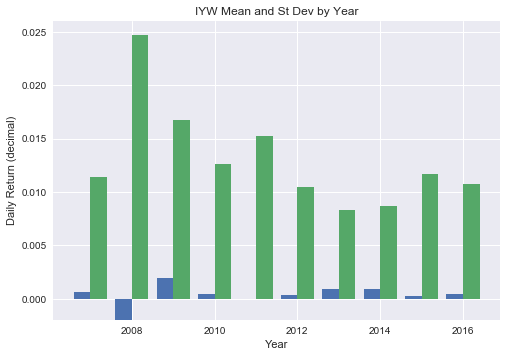


IYZ Descriptive Statistics
   year      mean       std
0  2007  0.000084  0.011724
1  2008 -0.001993  0.029043
2  2009  0.000888  0.017986
3  2010  0.000584  0.011218
4  2011 -0.000464  0.014333
5  2012  0.000622  0.008675
6  2013  0.000782  0.008760
7  2014  0.000074  0.009126
8  2015  0.000151  0.011145
9  2016  0.000678  0.012289


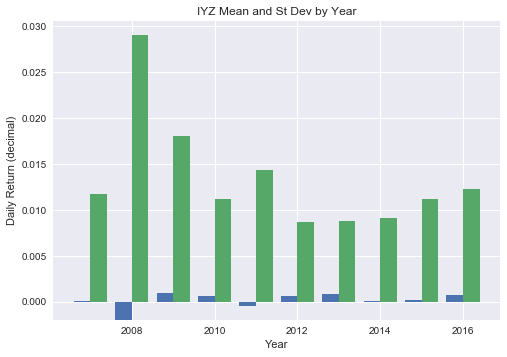

In [42]:
for name,group in groups_symbol:
    if(len(group)>1):
        print(name,'Descriptive Statistics')
        df_barchart_data = group.groupby('year').agg(['mean','std'])['PctChg'][1:].reset_index()
        print(df_barchart_data)
        ax = plt.subplot(111)
        plt.legend(loc='upper left')
        ax.bar(df_barchart_data.year-0.2,df_barchart_data['mean'],width=0.4,label='mean')
        ax.bar(df_barchart_data.year+0.2,df_barchart_data['std'],width=0.4,label='std')
        title = str(name) + ' Mean and St Dev by Year'
        plt.title(title)
        plt.xlabel('Year')
        plt.ylabel('Daily Return (decimal)')
        plt.show()
        print()

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


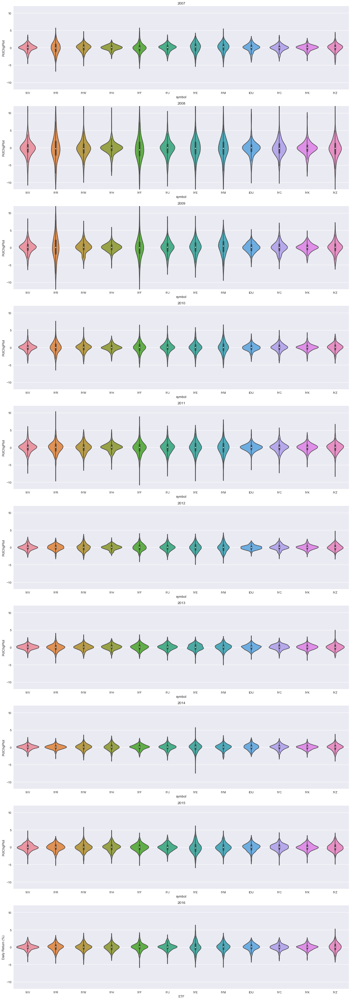

In [56]:
nrows = len(years)
fig, axes = plt.subplots(nrows,1,figsize=(20,60),sharey=True)
plt.ylim(-12,12)
for n in range(nrows):  
    year = years[n]
    group = groups_year.get_group(year)
    group['PctChgPlot'] = group['PctChg']*100
    x = group['symbol']
    y = group['PctChgPlot']
    sns.violinplot(x,y,ax=axes[n])
    axes[n].set_title(year)
    
plt.xlabel('ETF')
plt.ylabel('Daily Return (%)')
plt.show()


#for name,group in groups_year:
#    if(len(group)>len(symbols)):
#        group['PctChgPlot'] = group['PctChg']*100
#        group.boxplot(column='PctChgPlot',by='symbol',figsize=(26,25),whis=(0.5,99.5))
#        plt.title(name.year)
#        plt.xlabel('ETF')
#        plt.ylabel('Daily Return (%)')
#        plt.show()



In [45]:
#for name,group in groups_year:
#    if(len(group)>len(symbols)):
#        print(name.year,'Descriptive Statistics')
#        print(group.groupby('symbol').agg(['mean','std'])['PctChg'])

        
for name,group in groups_year:
    if(len(group)>len(symbols)):
        print(name.year,'Descriptive Statistics')
        df_barchart_data = group.groupby('symbol').agg(['mean','std'])['PctChg'][1:].reset_index()
        print(df_barchart_data)
        ax = plt.subplot(111)
        plt.legend(loc='upper left')
        ax.bar(df_barchart_data['symbol'].unstack()-0.2,df_barchart_data['mean'],width=0.4,label='mean')
        ax.bar(df_barchart_data['symbol'].unstack()+0.2,df_barchart_data['std'],width=0.4,label='std')
        title = str(name.year) + ' Mean and St Dev by ETF'
        plt.title(title)
        plt.xlabel('ETF')
        plt.ylabel('Daily Return (decimal)')
        plt.show()
        print()


2007 Descriptive Statistics
   symbol      mean       std
0     IVV  0.000172  0.010133
1     IYC -0.000301  0.009683
2     IYE  0.001292  0.014602
3     IYF -0.000764  0.014362
4     IYH  0.000311  0.007568
5     IYJ  0.000527  0.010059
6     IYK  0.000327  0.007776
7     IYM  0.001107  0.014202
8     IYR -0.000742  0.016222
9     IYW  0.000648  0.011445
10    IYZ  0.000084  0.011724


/Users/Derek/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


AttributeError: 'RangeIndex' object has no attribute 'labels'

<h1>More Detailed Analysis</h1>

We will now determine when the largest daily returns occurred.

In [39]:
pd.set_option('display.max_rows', 500)
df_etf_data[df_etf_data['PctChg']<-0.05]

,symbol,dateYYMD,PctChg,adjclose,amount,close,data,date,denominator,high,low,numerator,open,splitRatio,type,volume
446,IVV,2008-09-30,-0.074242,93.140396,NaN,112.349998,NaN,1222695000,NaN,119.500000,111.070000,NaN,119.330002,NaN,NaN,12131900.0
452,IVV,2008-10-08,-0.058073,83.233597,NaN,100.400002,NaN,1223386200,NaN,107.519997,99.599998,NaN,106.989998,NaN,NaN,10833500.0
454,IVV,2008-10-10,-0.065969,76.178627,NaN,91.889999,NaN,1223559000,NaN,100.809998,91.099998,NaN,99.849998,NaN,NaN,16950800.0
458,IVV,2008-10-16,-0.091646,75.266724,NaN,90.790001,NaN,1224077400,NaN,97.940002,90.690002,NaN,97.889999,NaN,NaN,8677300.0
463,IVV,2008-10-23,-0.054724,74.893661,NaN,90.339996,NaN,1224682200,NaN,93.680000,87.739998,NaN,93.400002,NaN,NaN,8730300.0
474,IVV,2008-11-07,-0.051742,75.357903,NaN,90.900002,NaN,1225981800,NaN,95.589996,90.290001,NaN,94.739998,NaN,NaN,8329500.0
483,IVV,2008-11-20,-0.056464,67.465645,NaN,81.379997,NaN,1227105000,NaN,87.010002,81.080002,NaN,86.070000,NaN,NaN,10613600.0
484,IVV,2008-11-21,-0.066232,62.997227,NaN,75.989998,NaN,1227191400,NaN,82.639999,75.209999,NaN,80.309998,NaN,NaN,18043400.0
490,IVV,2008-12-02,-0.087439,68.178612,NaN,82.239998,NaN,1228141800,NaN,87.709999,82.110001,NaN,87.660004,NaN,NaN,16389400.0
524,IVV,2009-01-21,-0.052681,67.448471,NaN,80.739998,NaN,1232461800,NaN,84.690002,80.660004,NaN,84.430000,NaN,NaN,6411400.0


Most of the large daily losses occured during the 2008-09 crash between late 2008 and early 2009. In addition, Real Estate, Materials and Financials saw large losses occur prior to the main 2008-09 crash (both before and after the S&P500 suffered its largest losses).

There was also the Black Monday 2011 on August 8, 2011 that had triggered a larger daily loss there as well.d

In [114]:
df_etf_data[df_etf_data['PctChg']>0.050]

,symbol,dateYYMD,PctChg,adjclose,amount,close,data,date,denominator,high,low,numerator,open,splitRatio,type,volume
456,IVV,2008-10-14,0.102842,83.656418,NaN,100.910004,NaN,1223904600,NaN,101.010002,93.339996,NaN,94.169998,NaN,NaN,6510500.0
467,IVV,2008-10-29,0.110993,78.085388,NaN,94.190002,NaN,1225200600,NaN,94.330002,84.720001,NaN,87.589996,NaN,NaN,9834100.0
479,IVV,2008-11-14,0.068174,75.987968,NaN,91.660004,NaN,1226586600,NaN,91.820000,82.260002,NaN,86.279999,NaN,NaN,13220400.0
485,IVV,2008-11-22,0.058955,66.711235,NaN,80.470001,NaN,1227277800,NaN,80.660004,74.500000,NaN,77.610001,NaN,NaN,15983000.0
486,IVV,2008-11-25,0.054927,70.375519,NaN,84.889999,NaN,1227537000,NaN,87.169998,81.339996,NaN,82.120003,NaN,NaN,17197600.0
558,IVV,2009-03-11,0.061299,60.456364,NaN,72.370003,NaN,1236691800,NaN,72.500000,69.489998,NaN,69.660004,NaN,NaN,8714700.0
567,IVV,2009-03-24,0.072868,69.369843,NaN,83.040001,NaN,1237815000,NaN,83.050003,79.160004,NaN,79.589996,NaN,NaN,8836400.0
1178,IVV,2011-08-10,0.051496,104.083916,NaN,118.430000,NaN,1312896600,NaN,118.430000,110.660004,NaN,114.500000,NaN,NaN,12599000.0
2830,IYR,2008-01-24,0.081790,43.558880,NaN,66.000000,NaN,1201098600,NaN,66.639999,59.450001,NaN,59.450001,NaN,NaN,23458200.0
2863,IYR,2008-03-12,0.071069,42.073902,NaN,63.750000,NaN,1205242200,NaN,63.750000,60.820000,NaN,61.200001,NaN,NaN,13369800.0


Much of the largest daily gains occurred during the same period as the largest daily losses during the 2008-09 crash.

/Users/Derek/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


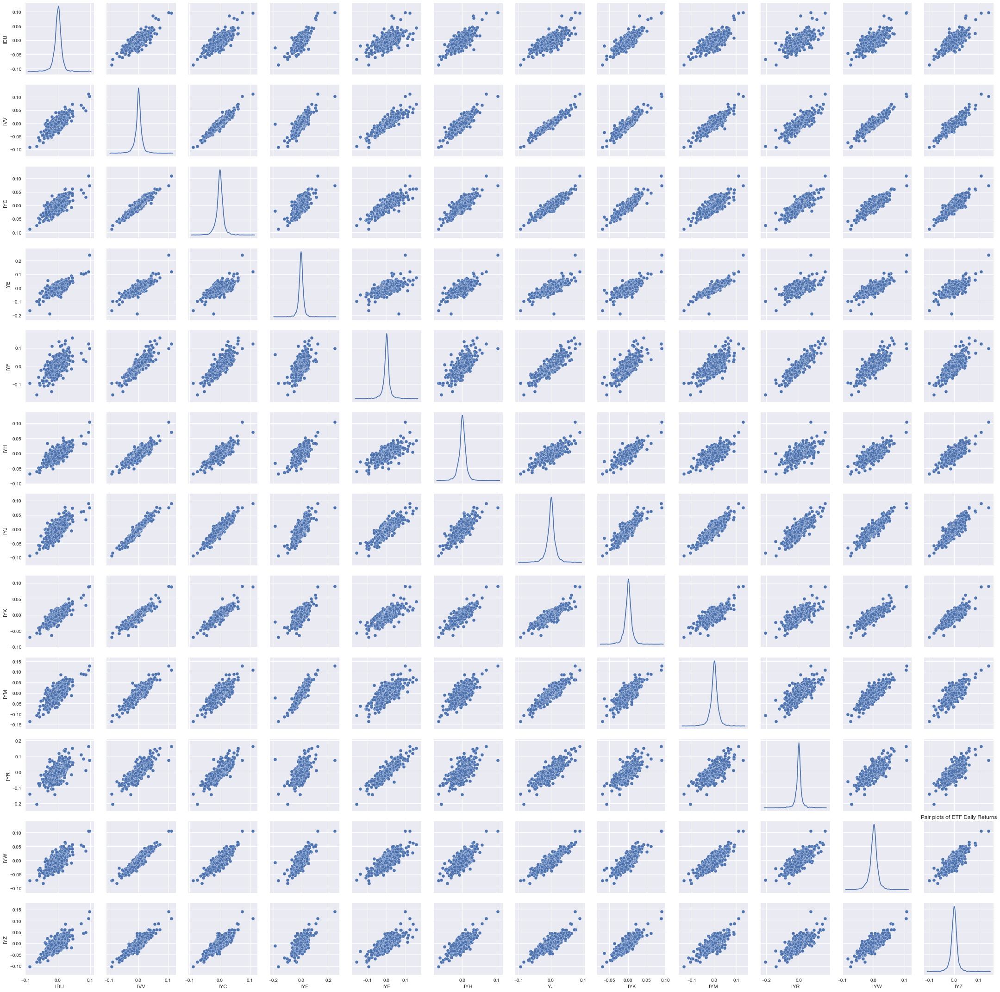

In [57]:
df_daily_returns = df_etf_data.pivot_table(values='PctChg',index='dateYYMD',columns='symbol')
df_daily_returns = df_daily_returns.dropna()

sns.pairplot(df_daily_returns,diag_kind='kde')
plt.title('Pair plots of ETF Daily Returns')
plt.show()

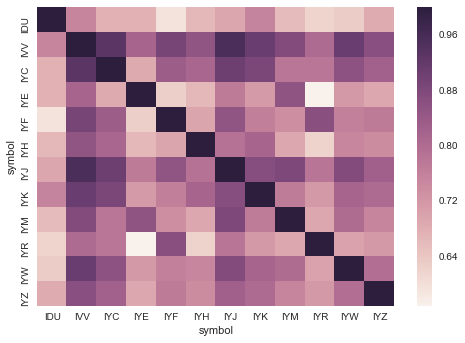

In [145]:
sns.heatmap(df_daily_returns.corr())
plt.show()

In general, all daily returns are positively correlated, although the degree does vary. 

In particular, the weakest correlations can be found between:
<ul>
<li>IYE (Energy) - IYR (Real Estate): 0.568026
<li>IYF (Finance) - IDU (Utilities): 0.593432
</ul>

The strongest correlations can be found between:
<ul>
<li>IVV (S&P 500) - IYJ (Industrials): 0.954606
<li>IVV (S&P 500) - IYC (Consumer Services): 0.932461
</ul>

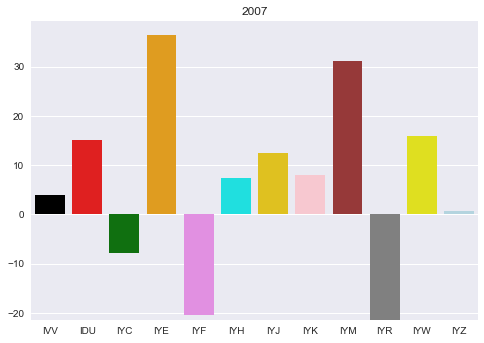

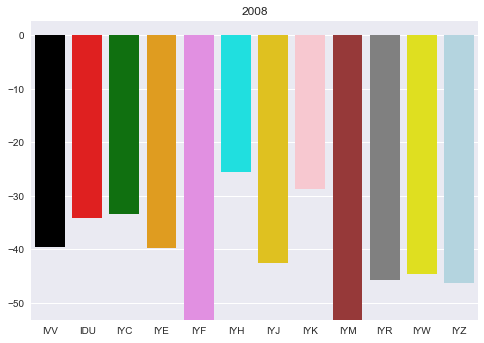

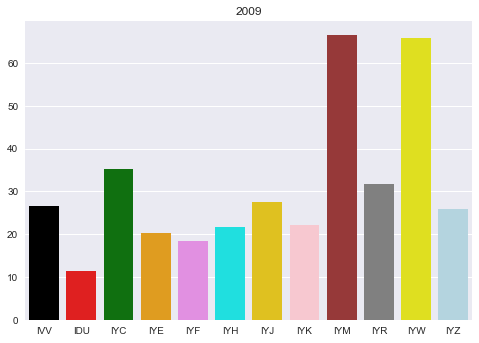

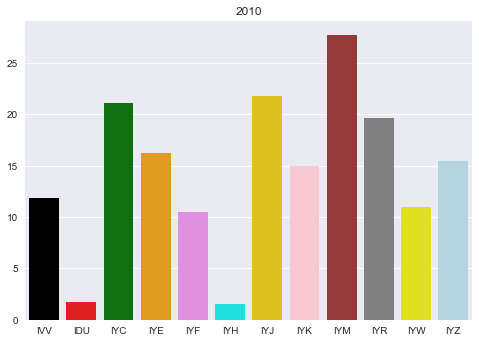

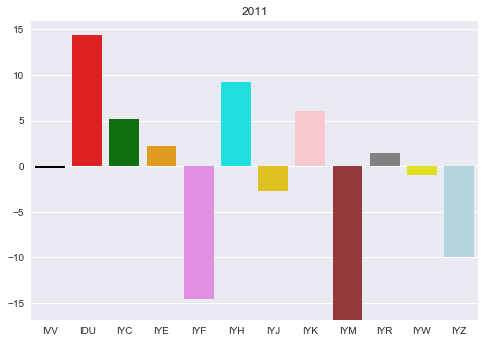

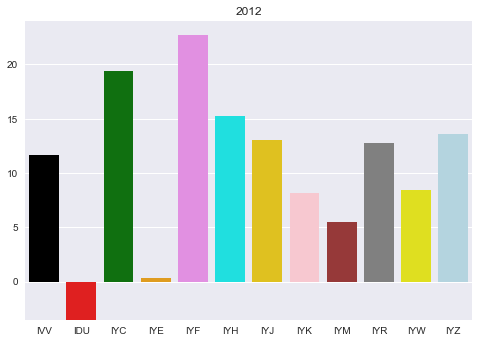

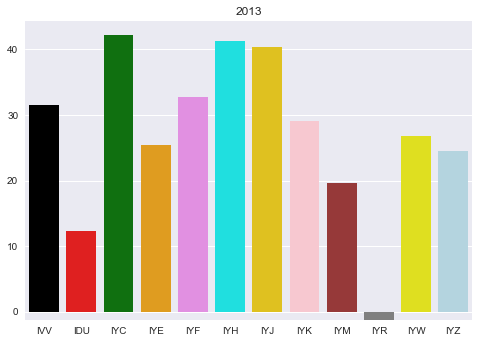

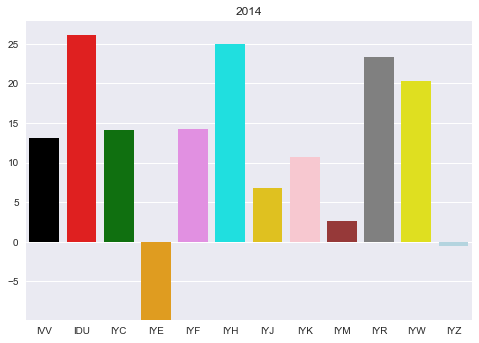

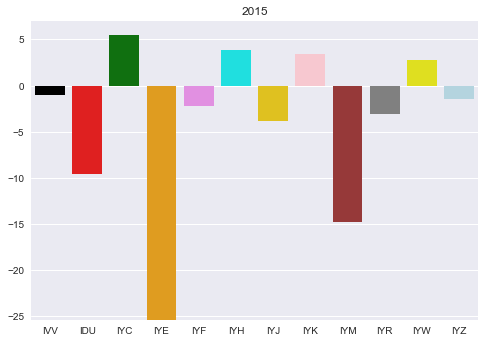

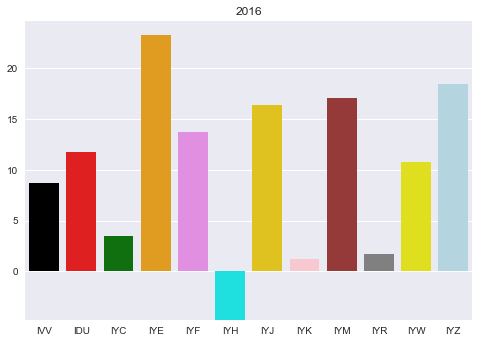

In [88]:
from cycler import cycler
color_cycle = cycler(color=['black','red','green','orange','violet','cyan','gold','pink','brown','grey','yellow','lightblue'])
#plt.rc('axes',prop_cycle=color_cycle)

df_daily_prices = df_etf_data.pivot_table(values='close',index='dateYYMD',columns='symbol')

groups_year2 = df_daily_prices.groupby(pd.TimeGrouper('A'))
for name,group in groups_year2:
    if (len(group)>1):

        df_ytd_return = pd.DataFrame()
        df_ytd_return['dateYYMD'] = group.index
        for symbol in symbols:
            #print(df_ytd_return.info())
            symbol_end_price = year_end_price[symbol][0]
            df_ytd_return[symbol] = group[symbol].values / symbol_end_price
            annual_return = df_ytd_return[symbol][-1:]-1
            #print(annual_return)
        df_annual_return = (df_ytd_return[-1:]-1)*100
        #print(df_annual_return.drop('dateYYMD',axis=1))
        graph_data = df_annual_return.drop('dateYYMD',axis=1)
        g=sns.barplot(data=graph_data)
        plt.title(str(name.year))
        plt.show()

        #for symbol in symbols:
        #    plt.plot(df_ytd_return['dateYYMD'],y[symbol],label=symbol)
        #plt.legend(loc='upper left')
        #plt.xlabel('Date')
        #plt.ylabel('YTD Return (%)')
        #title = str(name.year) + ' Returns'
        #plt.title(title)
        #plt.show()
    
    # capture the closing price in the last day of the year
    year_end_price = group.tail(1)
plt.show()

In [8]:
df_etf_year = groups.last()
df_etf_year.reset_index(inplace=True)
df_etf_year['year'] = df_etf_year['dateYYMD'].dt.year 
df_etf_closingprice_year = df_etf_year.set_index(['symbol','year']).drop(['dateYYMD'],axis=1)

In [9]:
dict_endprices = df_etf_closingprice_year['adjclose'].to_dict()

In [118]:
df_normalized_price = pd.DataFrame()
df_normalized_price['dateYYMD'] = df_daily_returns.index
for symbol in symbols:
    df_normalized_price[symbol] = df_daily_returns[symbol].values + 1
df_normalized_price.set_index('dateYYMD',inplace=True)

In [114]:
df_cumprod_return = df_normalized_price.set_index('dateYYMD').cumprod()

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:1: FutureWarning: pd.rolling_apply is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(window=252,center=False).apply(func=<function>,args=<tuple>,kwargs=<dict>)
  if __name__ == '__main__':
/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:6: FutureWarning: pd.rolling_apply is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(window=21,center=False).apply(func=<function>,args=<tuple>,kwargs=<dict>)


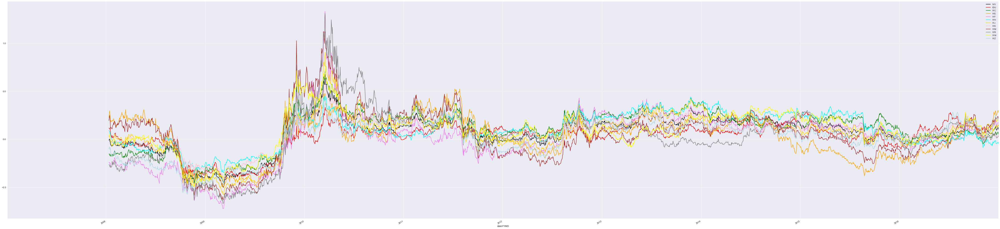

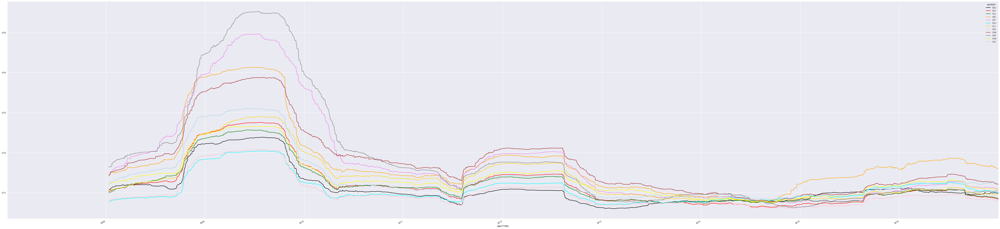

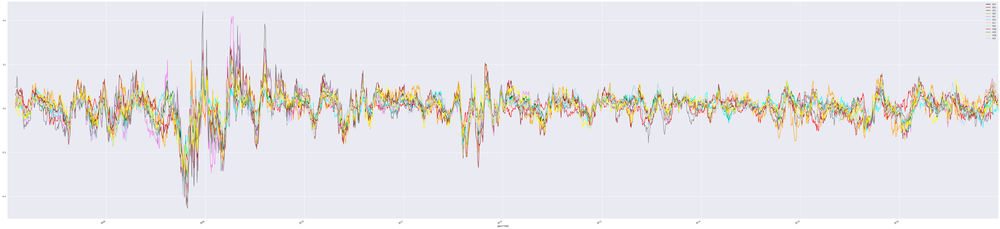

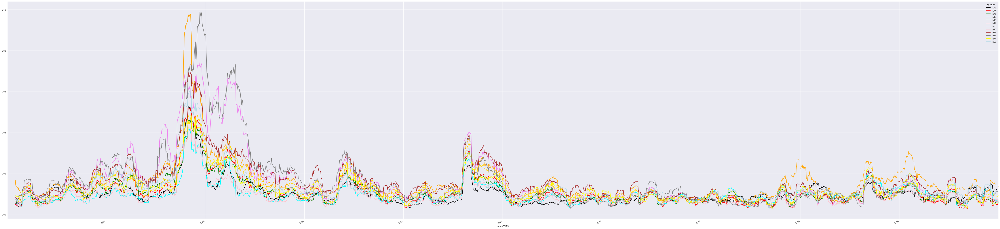

In [206]:
df_rolling_1y_ret = pd.rolling_apply(df_normalized_price,252, lambda x: np.prod(x)-1)
df_rolling_1y_std = df_daily_returns.rolling(252).std()
df_rolling_1y_ret.plot(figsize=(80,20))
df_rolling_1y_std.plot(figsize=(80,20))

df_rolling_1m_ret = pd.rolling_apply(df_normalized_price,21, lambda x: np.prod(x)-1)
df_rolling_1m_std = df_daily_returns.rolling(21).std()

df_rolling_1m_ret.plot(figsize=(80,20))
df_rolling_1m_std.plot(figsize=(80,20))

plt.show()
#df_normalized_price.head()
#strat['roll12mret'] = strat['Strategy'].rolling(window=252).sum()

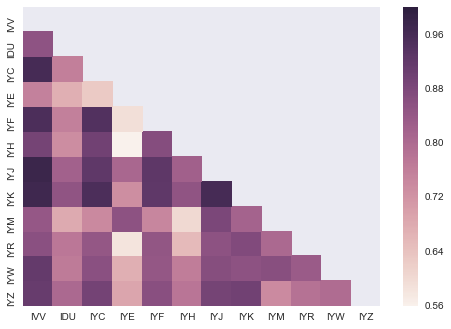

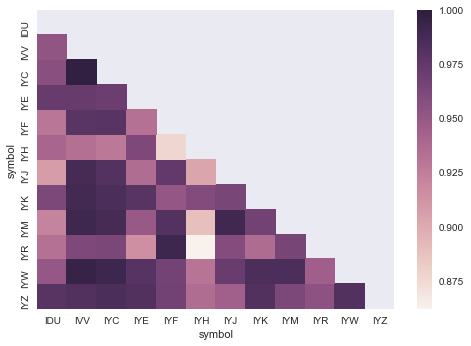

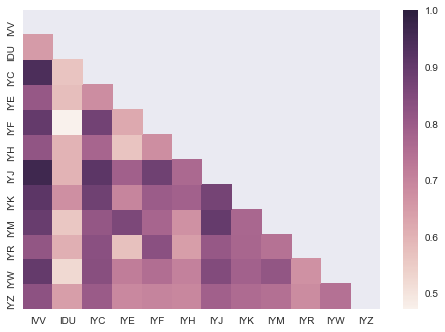

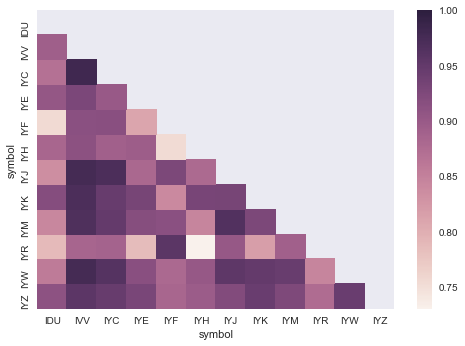

In [175]:
corr_1yret = df_rolling_1y_ret.corr()
corr_1ystd = df_rolling_1y_std.corr()
corr_1mret = df_rolling_1m_ret.corr()
corr_1mstd = df_rolling_1m_std.corr()

mask = np.zeros_like(corr_1yret, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr_1yret,mask=mask)
plt.show()
sns.heatmap(corr_1ystd,mask=mask)
plt.show()
sns.heatmap(corr_1mret,mask=mask)
plt.show()
sns.heatmap(corr_1mstd,mask=mask)
plt.show()

In [172]:
print(df_rolling_1y_ret.idxmin())
print(df_rolling_1y_ret.min())
print(df_rolling_1y_ret.idxmax())
print(df_rolling_1y_ret.max())

IVV   2009-03-10
IDU   2009-03-10
IYC   2008-11-21
IYE   2009-03-10
IYF   2009-03-07
IYH   2008-11-21
IYJ   2009-03-10
IYK   2009-03-10
IYM   2009-03-10
IYR   2009-03-07
IYW   2008-11-21
IYZ   2008-10-28
dtype: datetime64[ns]
IVV   -0.500628
IDU   -0.450054
IYC   -0.458191
IYE   -0.505123
IYF   -0.723296
IYH   -0.352926
IYJ   -0.577567
IYK   -0.400499
IYM   -0.627189
IYR   -0.669798
IYW   -0.497459
IYZ   -0.572266
dtype: float64
IVV   2010-03-19
IDU   2010-03-19
IYC   2010-03-19
IYE   2011-07-09
IYF   2010-03-18
IYH   2010-03-19
IYJ   2010-03-19
IYK   2010-03-19
IYM   2010-03-17
IYR   2010-03-18
IYW   2010-03-19
IYZ   2010-03-19
dtype: datetime64[ns]
IVV    0.675329
IDU    0.333009
IYC    0.733173
IYE    0.523884
IYF    1.332561
IYH    0.449995
IYJ    0.905338
IYK    0.564616
IYM    1.124274
IYR    1.309710
IYW    0.766550
IYZ    0.432459
dtype: float64


In [176]:
print(df_rolling_1m_ret.idxmin())
print(df_rolling_1m_ret.min())
print(df_rolling_1m_ret.idxmax())
print(df_rolling_1m_ret.max())

IVV   2008-10-28
IDU   2008-10-16
IYC   2008-10-16
IYE   2008-10-28
IYF   2008-10-10
IYH   2008-10-11
IYJ   2008-10-28
IYK   2008-10-23
IYM   2008-10-28
IYR   2008-10-28
IYW   2008-10-28
IYZ   2008-10-10
dtype: datetime64[ns]
IVV   -0.301417
IDU   -0.299565
IYC   -0.329987
IYE   -0.375780
IYF   -0.391436
IYH   -0.240426
IYJ   -0.336358
IYK   -0.271840
IYM   -0.432014
IYR   -0.456079
IYW   -0.299859
IYZ   -0.379050
dtype: float64
IVV   2009-04-07
IDU   2009-04-09
IYC   2008-12-23
IYE   2008-11-11
IYF   2009-04-14
IYH   2008-12-23
IYJ   2009-04-07
IYK   2009-04-07
IYM   2009-04-03
IYR   2008-12-23
IYW   2009-04-09
IYZ   2008-12-23
dtype: datetime64[ns]
IVV    0.189250
IDU    0.136623
IYC    0.219614
IYE    0.221221
IYF    0.419573
IYH    0.148302
IYJ    0.221938
IYK    0.133676
IYM    0.281596
IYR    0.441502
IYW    0.222386
IYZ    0.220690
dtype: float64


In [233]:
df_ind_beativv = pd.DataFrame()
df_ind_beativv = df_daily_returns.dropna(axis=0)
#df_ind_beativv = df_rolling_1y_ret.dropna(axis=0)

for symbol in symbols:
    #df_ind_beativv[symbol] = df_rolling_1y_ret[symbol] > df_rolling_1y_ret['IVV']
    df_ind_beativv[symbol] = df_daily_returns[symbol] > df_daily_returns['IVV']

df_ind_beativv.drop('IVV',axis=1,inplace=True)
#for idx,row in df_rolling_1y_ret.iterrows():
#    #print(row,idx)
    
#    print(idx,row)
print(df_ind_beativv.head())

symbol        IDU    IYC    IYE    IYF    IYH    IYJ    IYK    IYM    IYR  \
dateYYMD                                                                    
2007-01-04   True   True  False   True   True   True   True  False   True   
2007-01-05  False   True  False  False   True  False  False  False  False   
2007-01-06  False   True   True  False   True   True   True  False  False   
2007-01-09  False  False  False  False  False  False  False   True  False   
2007-01-10   True   True  False   True  False   True   True  False   True   

symbol        IYW    IYZ  
dateYYMD                  
2007-01-04   True   True  
2007-01-05   True  False  
2007-01-06  False  False  
2007-01-09  False  False  
2007-01-10   True  False  


In [234]:
for item,row in df_ind_beativv.iteritems():
    print(item,len(df_ind_beativv[df_ind_beativv[item]]))

print()    
for item,row in df_ind_beativv.iteritems():
    print(item,len(df_ind_beativv[df_ind_beativv[item]==False]))

IDU 1227
IYC 1236
IYE 1230
IYF 1152
IYH 1292
IYJ 1255
IYK 1255
IYM 1256
IYR 1231
IYW 1297
IYZ 1205

IDU 1233
IYC 1224
IYE 1230
IYF 1308
IYH 1168
IYJ 1205
IYK 1205
IYM 1204
IYR 1229
IYW 1163
IYZ 1255


symbol          IDU          IYC          IYE          IYF          IYH  \
count   2460.000000  2460.000000  2460.000000  2460.000000  2460.000000   
mean      -0.000118     0.000125    -0.000014    -0.000135     0.000085   
std        0.008791     0.004720     0.011378     0.010717     0.006772   
min       -0.047589    -0.034422    -0.185062    -0.086713    -0.041432   
25%       -0.004865    -0.002506    -0.005176    -0.003567    -0.002988   
50%       -0.000040     0.000014     0.000004    -0.000358     0.000296   
75%        0.004970     0.002734     0.004922     0.002815     0.003548   
max        0.038254     0.029404     0.140911     0.095957     0.037181   

symbol          IYJ          IYK          IYM          IYR          IYW  \
count   2460.000000  2460.000000  2460.000000  2460.000000  2460.000000   
mean       0.000057     0.000017     0.000013    -0.000081     0.000123   
std        0.004305     0.005541     0.009621     0.013866     0.005791   
min       -0.027776    -

/Users/Derek/anaconda/lib/python3.6/site-packages/seaborn/categorical.py:2171: UserWarning: The boxplot API has been changed. Attempting to adjust your arguments for the new API (which might not work). Please update your code. See the version 0.6 release notes for more info.
  warnings.warn(msg, UserWarning)


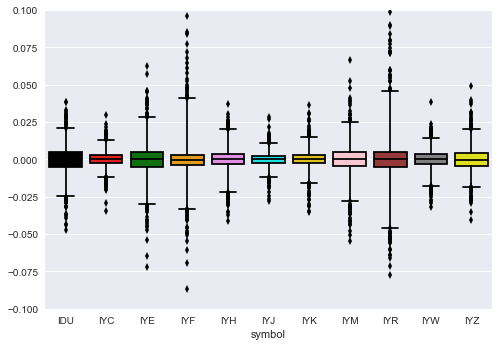

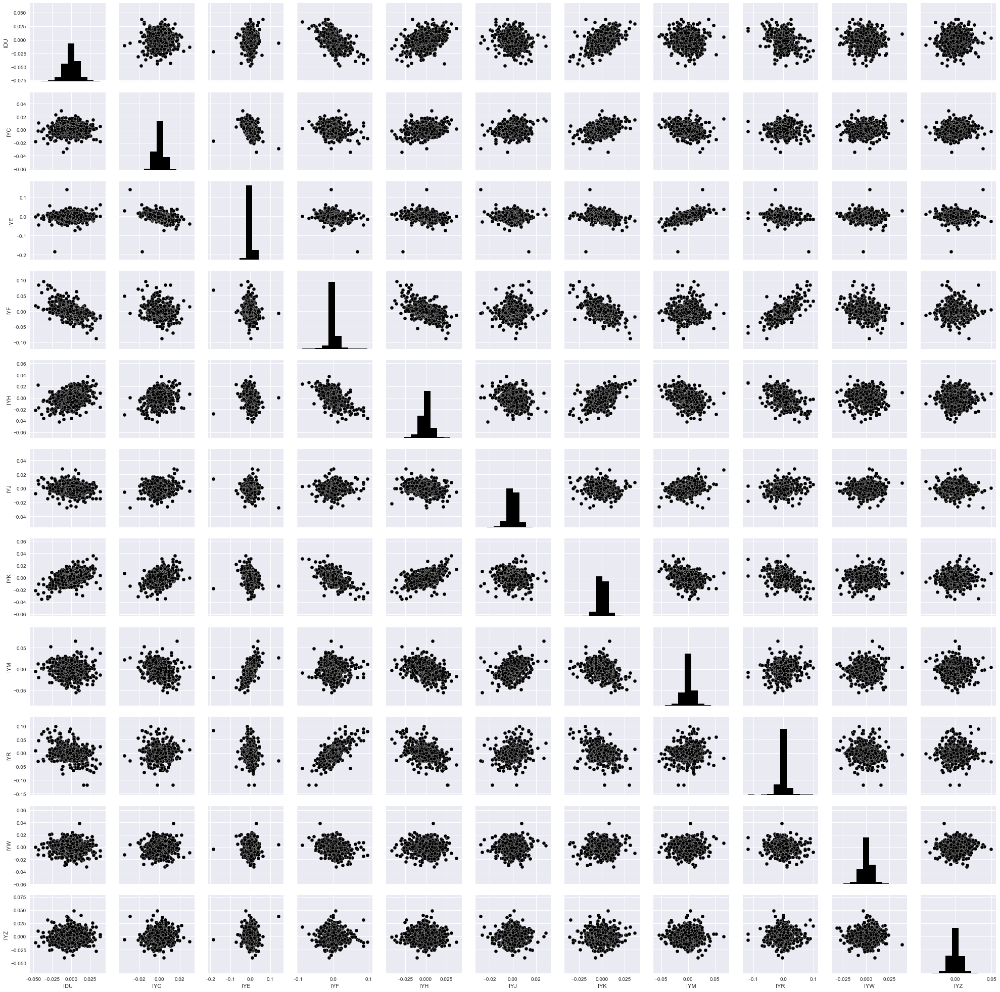

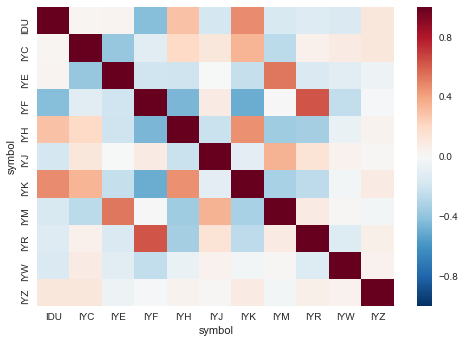

In [243]:
df_margin_overivv = pd.DataFrame()
df_margin_overivv = df_daily_returns.dropna(axis=0) #df_rolling_1y_ret.dropna(axis=0)

for symbol in symbols:
    df_margin_overivv[symbol] = df_daily_returns[symbol] - df_daily_returns['IVV']
    #df_margin_overivv[symbol] = df_rolling_1y_ret[symbol] - df_rolling_1y_ret['IVV']

df_margin_overivv.drop('IVV',axis=1,inplace=True)
#for idx,row in df_rolling_1y_ret.iterrows():
#    #print(row,idx)
    
#    print(idx,row)
print(df_margin_overivv.describe())
df_margin_overivv_corr = df_margin_overivv.corr()
sns.boxplot(df_margin_overivv,whis=(1,99))
plt.ylim(-0.1,0.1)
plt.show()
sns.pairplot(df_margin_overivv)
plt.show()
sns.heatmap(df_margin_overivv_corr)
plt.show()

In [209]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import BayesianRidge

X = 
y = 
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)

clf_poly = BayesianRidge()
clf_poly.fit()

In [171]:
df_rolling_1y_ret[df_rolling_1y_ret['IYJ']<-0.5]

,IVV,IDU,IYC,IYE,IYF,IYH,IYJ,IYK,IYM,IYR,IYW,IYZ
dateYYMD,,,,,,,,,,,,
2009-02-24,-0.433227,-0.370952,-0.395138,-0.431422,-0.671236,-0.236120,-0.500996,-0.339204,-0.583924,-0.600903,-0.389459,-0.413142
2009-02-26,-0.429288,-0.363028,-0.386328,-0.423834,-0.649270,-0.248833,-0.508404,-0.339253,-0.578610,-0.593728,-0.386202,-0.413707
2009-02-27,-0.431214,-0.367393,-0.393690,-0.423603,-0.639321,-0.278051,-0.508704,-0.344936,-0.581130,-0.608026,-0.381168,-0.408303
2009-02-28,-0.443287,-0.378761,-0.394805,-0.436210,-0.657234,-0.308531,-0.515960,-0.352488,-0.581309,-0.612438,-0.377395,-0.407213
2009-03-03,-0.468982,-0.403641,-0.412521,-0.488747,-0.672334,-0.342307,-0.546809,-0.372211,-0.623783,-0.633173,-0.391132,-0.414792
2009-03-04,-0.477612,-0.426094,-0.424880,-0.495541,-0.687245,-0.340090,-0.555664,-0.376448,-0.623523,-0.640161,-0.401716,-0.423944
2009-03-05,-0.458199,-0.405265,-0.402707,-0.460717,-0.686567,-0.316586,-0.540280,-0.362869,-0.597181,-0.622094,-0.379529,-0.391905
2009-03-06,-0.485031,-0.433005,-0.428960,-0.492473,-0.715956,-0.337690,-0.562204,-0.387637,-0.617776,-0.654528,-0.399056,-0.418137
2009-03-07,-0.491356,-0.431791,-0.438626,-0.498088,-0.723296,-0.338875,-0.571628,-0.389727,-0.623384,-0.669798,-0.408585,-0.430440
